<a href="https://colab.research.google.com/github/Blacklotus89898/ComputerVisionMiscellaneous/blob/main/esce_415_a2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Computer Vision (ECSE 415)
## Assignment 2: Feature Matching, Image Alignment

DEADLINE: October 10, 11:59 PM

Name: Steve Chen
ID: 261106847

0. Setup and Environment

In [17]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


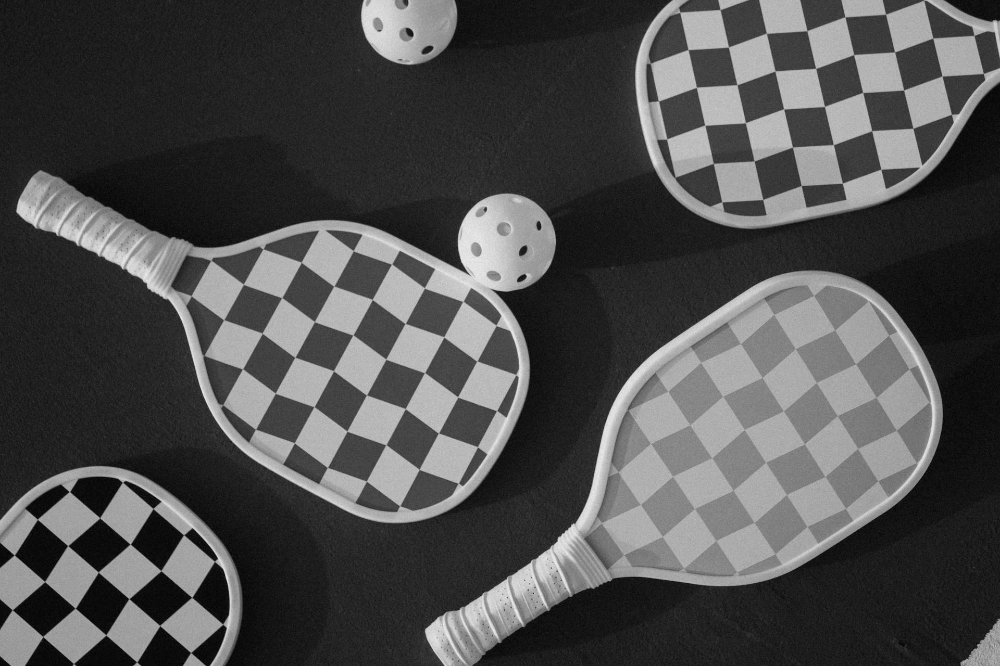

Height: 1280
Width: 1920
Channels: 3


In [18]:
# Loading from the drive
from google.colab import drive
drive.mount('/content/drive')

base_path = "/content/drive/MyDrive/ECSE415/images"
img_path = os.path.join(base_path, "checkered_pickleball_paddles.png")
img = cv2.imread(img_path)
cv2_imshow(img)

height, width, channels = img.shape
print("Height:", height)
print("Width:", width)
print("Channels:", channels)

## 1 Harris Corner Detection [40 points]


### 1.1. Implement Harris Corner Detection. [20 points]

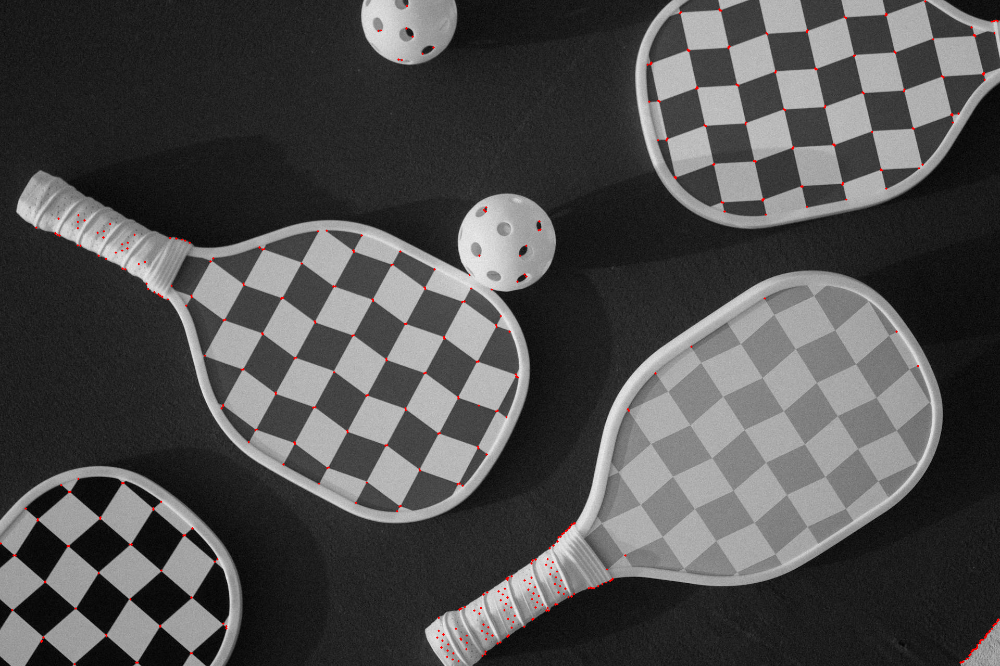

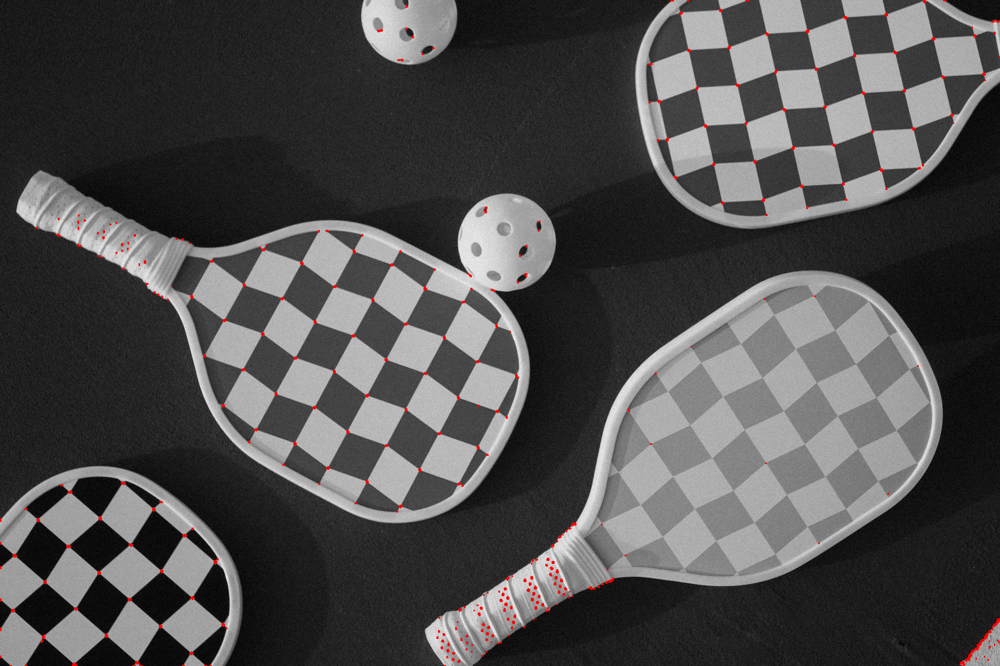

In [21]:
import cv2
import numpy as np

def harris_corner_detection(image, alpha=0.05, threshold=1e6):
    """
    Harris corner detector (manual implementation).
    image: grayscale input (uint8)
    alpha: Harris detector free parameter (0.04 - 0.06 typical)
    threshold: minimum R response to keep a corner
    returns: list of (x, y) corner coordinates
    """
    # Ensure float for calculations
    image = np.float32(image)

    # Prewitt filters
    Dx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]], dtype=np.float32)  # along x
    Dy = np.array([[-1,-1,-1],[0,0,0],[1,1,1]], dtype=np.float32)  # along y

    # Sobel filters
    Dx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)  # along x
    Dy = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=np.float32)  # along y

    # Derivatives
    Ix = cv2.filter2D(image, -1, Dx)
    Iy = cv2.filter2D(image, -1, Dy)

    # Products of derivatives
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    # Gaussian smoothing
    Gxx = cv2.GaussianBlur(Ixx, (3, 3), 1.5)
    Gyy = cv2.GaussianBlur(Iyy, (3, 3), 1.5)
    Gxy = cv2.GaussianBlur(Ixy, (3, 3), 1.5)

    # Harris response
    R = Gxx * Gyy - Gxy**2 - alpha * (Gxx + Gyy)**2

    # Non-maximum suppression
    candidates = []
    for y in range(1, R.shape[0]-1):
        for x in range(1, R.shape[1]-1):
            val = R[y, x]
            if val > threshold and val == np.max(R[y-1:y+2, x-1:x+2]):
                candidates.append((x, y))

    return candidates


# Visualizing
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

corners = harris_corner_detection(gray, alpha=0.05, threshold=1e8)

img_color = img.copy()
for (x,y) in corners:
    cv2.circle(img_color, (x,y), 2, (0,0,255), -1)

cv2_imshow(img_color)

# Comparing with CV2
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)
dst = cv2.dilate(dst, None)
img_color = img.copy()
img_color[dst > 0.01 * dst.max()] = [0, 0, 255]
cv2_imshow(img_color)

### 1.2. Visualize Harris Corners. [5 points]

### 1.3. Threshold Exploration [5 points]

### 1.4. Harris Corners in Transformed Images (Rotation and Scaling). [10 points]

## 2 SIFT Feature Detection [30 points]

### 2.1. Implement SIFT Keypoint Detection and Matching. [20 points]

### 2.2. SIFT Keypoints on Transformed Images (Rotation and Scaling). [10 points]

## 3 Image Alignment [30 points]

### 3.1. Keypoint Detection and Matching. [5 points]

### 3.2. Homography Estimation and Verification. [10 points]

### 3.3. Image Stitching and Blending. [10 points]

### 3.4. Evaluation and Reflection. [5 point]